In [5]:
import os
import warnings
from argparse import ArgumentParser
import random
from pathlib import Path
import matplotlib.pyplot as plt
import cv2

from xtcocotools.coco import COCO
from mmpose.apis import (inference_top_down_pose_model, init_pose_model, vis_pose_result)
from mmpose.datasets import DatasetInfo


def cv2_imshow(a, **kwargs):
    a = a.clip(0, 255).astype('uint8')
    # cv2 stores colors as BGR; convert to RGB
    if a.ndim == 3:
        if a.shape[2] == 4:
            a = cv2.cvtColor(a, cv2.COLOR_BGRA2RGBA)
        else:
            a = cv2.cvtColor(a, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(50, 50))
    return plt.imshow(a, **kwargs)

# 모델 추론

In [6]:
pose_config = 'nia_config_base.py'
pose_checkpoint = '../work_dirs/nia_config_base/latest.pth'
img_root = '../data/nia/1.원천데이터/'
json_file = '../data/nia/keypoint_test_label.json'
out_img_root = '../work_dirs/vis_results/'
device = 'cuda:0'
kpt_thr = 0.3

In [7]:
assert (out_img_root != '')

coco = COCO(json_file)
# build the pose model from a config file and a checkpoint file
pose_model = init_pose_model(
    pose_config, pose_checkpoint, device=device.lower())

dataset = pose_model.cfg.data['test']['type']
dataset_info = pose_model.cfg.data['test'].get('dataset_info', None)
if dataset_info is None:
    warnings.warn(
        'Please set `dataset_info` in the config.'
        'Check https://github.com/open-mmlab/mmpose/pull/663 for details.',
        DeprecationWarning)
else:
    dataset_info = DatasetInfo(dataset_info)

img_keys = list(coco.imgs.keys())

# optional
return_heatmap = False

# e.g. use ('backbone', ) to return backbone feature
output_layer_names = None

# process each image
for i in range(len(img_keys)):
    # get bounding box annotations
    image_id = img_keys[i]
    image = coco.loadImgs(image_id)[0]
    image_name = os.path.join(img_root, image['file_name'])
    ann_ids = coco.getAnnIds(image_id)

    # make person bounding boxes
    person_results = []
    for ann_id in ann_ids:
        person = {}
        ann = coco.anns[ann_id]
        # bbox format is 'xywh'
        person['bbox'] = ann['bbox']
        person_results.append(person)

    # test a single image, with a list of bboxes
    pose_results, returned_outputs = inference_top_down_pose_model(
        pose_model,
        image_name,
        person_results,
        bbox_thr=None,
        format='xywh',
        dataset=dataset,
        dataset_info=dataset_info,
        return_heatmap=return_heatmap,
        outputs=output_layer_names)

    if out_img_root == '':
        out_file = None
    else:
        os.makedirs(out_img_root, exist_ok=True)
        out_file = os.path.join(out_img_root, f'vis_{i}.jpg')

    vis_pose_result(
        pose_model,
        image_name,
        pose_results,
        dataset=dataset,
        dataset_info=dataset_info,
        kpt_score_thr=kpt_thr,
        radius=4,
        thickness=2,
        show=False,
        out_file=out_file)

loading annotations into memory...
Done (t=0.03s)
creating index...
index created!
Use load_from_local loader


# 추론 결과

In [8]:
result_dir = Path('/root/ViTPose/work_dirs/vis_results/')
file_path = list(result_dir.glob('*.jpg'))

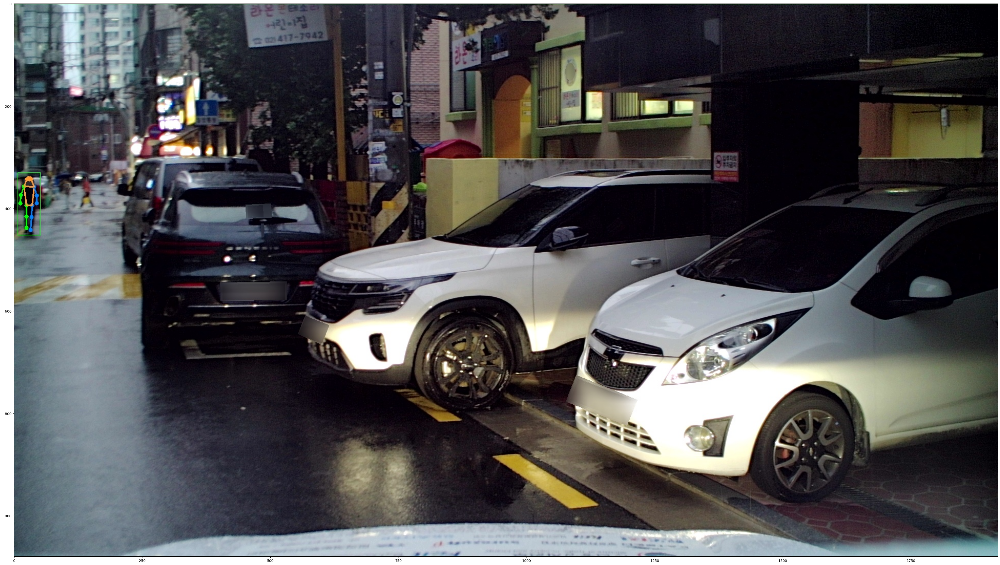

In [12]:
sample = random.sample(file_path, 1)[0]
img = cv2.imread(sample.as_posix())
cv2_imshow(img)